# HRV EDA

In [2]:
import importlib
import project_utils.deciles as deciles
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from general_utils import utils
from general_utils.OverallDetailComparisonPlot import OverallDetailComparisonPlot
import os

utils.default_plot_format()
utils.pd_display_settings(3)

Predefine where data is and where the plotly images will be saved

In [3]:
#data_path = r'processed_data\5min_nabian_2025_03_03.pkl'
data_path = r"processed_data\raw_metrics\processed_10min_Nabian.pkl"
#data_path = "processed_data/manual_10min_2025_03_03.pkl"
#data_path = r'processed_data\raw_metrics\optimized_20min_Nabian.pkl'
title_addon = " (10 min segments)"

In [4]:
pickled = pd.read_pickle(data_path)
data = pickled["data"]
indicator_columns = pickled["indicator_columns"]
time_metrics = pickled["time_metrics"]
frequency_metrics = pickled["frequency_metrics"]
non_linear_metrics = pickled["non_linear_metrics"]
data.tail()

,t_start,t_end,SDRR,RMSSD,pNN50 (%),Mean HR (bpm),ULF Power,ULF Peak Frequency,ULF Peak Power,VLF Power,...,UCr (g),UACR (mg÷g),Complications,Nephropathy,Retinopathy and cataract,DPN,Heart Disease,atherosclerosis or stenosis,Carotid Plaque,Condition
3250,22212,22812,30.89,24.63,3.13,79.80,2.35e-08,0,1.61e-05,4.24e-06,...,7.26,2.88,1,1,0,True,0,0,1,DPN
3251,21611,22211,40.47,34.10,13.03,77.50,1.07e-08,0,9.96e-06,2.39e-06,...,7.26,2.88,1,1,0,True,0,0,1,DPN
3252,21010,21610,38.71,41.98,27.34,75.71,1.28e-09,0.00167,1.49e-06,3.11e-06,...,7.26,2.88,1,1,0,True,0,0,1,DPN
3253,34218,34818,88.51,31.71,12.61,79.37,1.33e-08,0.00167,1.59e-05,3.19e-06,...,7.26,2.88,1,1,0,True,0,0,1,DPN
3254,76304,76903,173.75,220.18,22.22,74.74,3.17e-09,0.00167,3.57e-06,1.2e-06,...,10.23,0.43,1,0,0,True,0,0,1,DPN


# Median only comparison:
We first derive median of each metric and put them into a single df

In [5]:
def produce_median_melt(data):
    median_df = data.groupby(['id', 'DPN'])[indicator_columns].median()
    median_df = median_df.reset_index()


    median_melted = pd.melt(
        median_df, 
        id_vars=['id', 'DPN'], 
        value_vars=indicator_columns,
        var_name='metric', 
        value_name='value'
    ).reset_index(drop=True)

    return median_melted

median_melted = produce_median_melt(data)

median_melted.tail(3)

,id,DPN,metric,value
517,38,True,D2,-2.16
518,39,True,D2,-3.26
519,40,True,D2,-2.75


In [6]:
from general_utils import CorrectedMultivariableTest as CMT

importlib.reload(CMT)


test = CMT.CorrectedMultivariableTest(
    data=median_melted, 
    group_col='metric',
    value_col='value',
    cat_col='DPN',
    cat_val_1=False,
    cat_val_2=True
)


result = test.perform_ManWhitney_U_tests()
result.sort_values('p_value', inplace=True)
display(result)
result.reset_index(inplace=True, drop=False)

,U_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
HF Power,80,0.00709,True,20,0.05,True
LF Power,76,0.0207,True,19,0.0475,True
SDRR,74,0.0322,True,17,0.0425,True
SD2,74,0.0322,True,18,0.045,True
S,73,0.0395,True,16,0.04,True
SD1,71,0.0577,False,15,0.0375,False
RMSSD,71,0.0577,False,14,0.035,False
Mean HR (bpm),18,0.0689,False,13,0.0325,False
pNN50 (%),69,0.0815,False,12,0.03,False


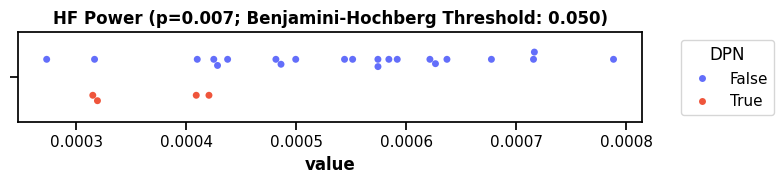

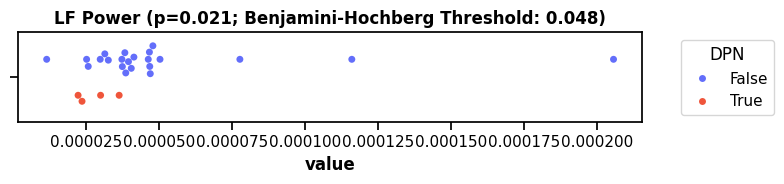

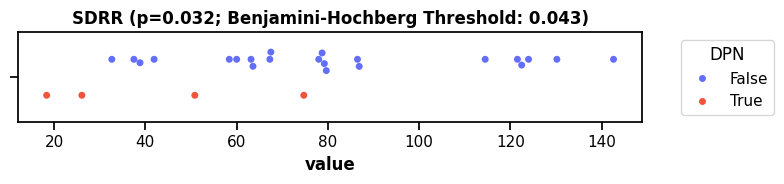

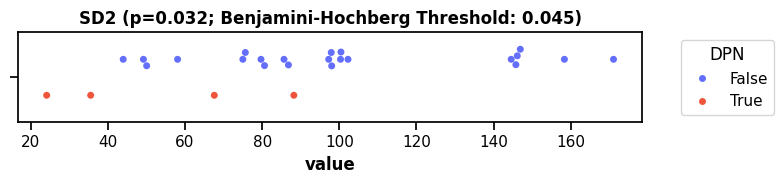

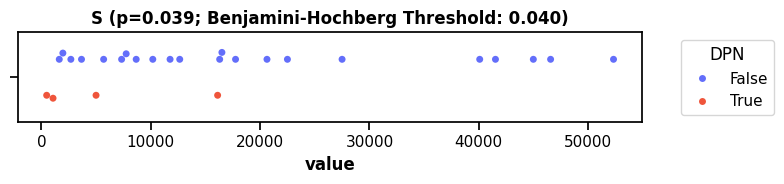

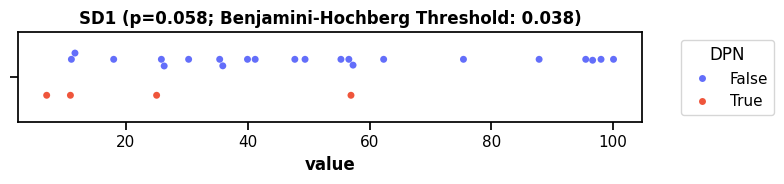

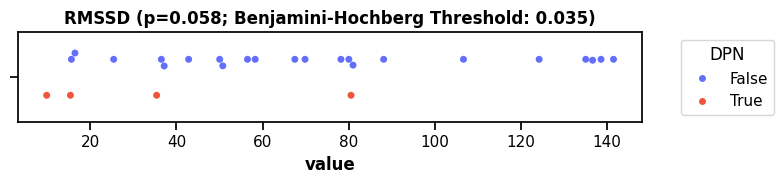

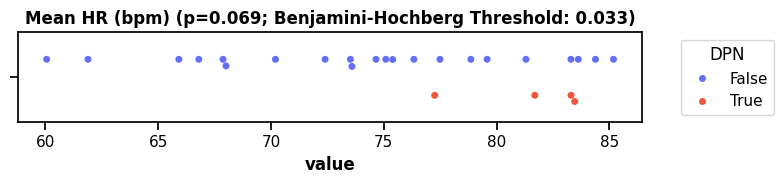

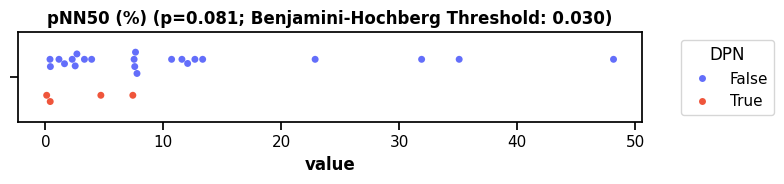

In [7]:
for i, row in result.iterrows():
    if row['p_value']<0.1:
        title = f"{row['metric']} (p={row['p_value']:.3f}; Benjamini-Hochberg Threshold: {row['BH_threshold']:.3f})"
        plt.figure(figsize=(8, 2))
        plt.title(title)
        sns.swarmplot(
            data=median_melted[median_melted['metric'] == row['metric']],  
            hue = 'DPN',
            x='value',
            dodge=True
        )
        # Move legend outside the plot
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='DPN')
        plt.tight_layout()

# MEDIAN ABSOLUTE DEVIATION

In [8]:
def normalize_melt(df):
    df = df[df.metric!='D2']
    for metric in df["metric"].unique():
        mask = df["metric"]==metric
        values = df[df["metric"]==metric]["value"]
        df.loc[mask, "value"] = values / values.max()

    return df


def plot_normalized(df, title=None, figsize=(8, 15)):
    plt.figure(figsize=figsize)
    sns.swarmplot(data=df, y='metric', x='value', hue = 'DPN', size=4)
    plt.title(title)
    plt.show()

In [9]:
# Mad values
import scipy.stats as stats
import numpy as np


mad=data.groupby(["id", 'DPN'])[indicator_columns].agg(stats.median_abs_deviation)
mad_melt = mad.reset_index().melt(id_vars=["id", 'DPN'], value_vars=indicator_columns, var_name='metric', value_name = 'value')
display(mad_melt)

,id,DPN,metric,value
0,0,False,SDRR,20.41
1,3,False,SDRR,25.05
2,4,False,SDRR,31.20
3,5,False,SDRR,16.02
4,7,False,SDRR,30.90
...,...,...,...,...
515,35,False,D2,NaN
516,37,True,D2,NaN
517,38,True,D2,NaN
518,39,True,D2,NaN


In [10]:
test = CMT.CorrectedMultivariableTest(
    data=mad_melt, 
    group_col='metric',
    value_col='value',
    cat_col='DPN',
    cat_val_1=False,
    cat_val_2=True
)


result = test.perform_ManWhitney_U_tests()
result.sort_values('p_value', inplace=True)
display(result)
result.reset_index(inplace=True, drop=False)

,U_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
SampEn,14,0.0322,True,19,0.0475,True
DFA α1,17,0.0577,False,18,0.045,False
ApEn,18,0.0689,False,17,0.0425,False
LF Peak Frequency,19,0.0815,False,16,0.04,False
VLF Peak Frequency,20,0.0959,False,14,0.035,False
S,68,0.0959,False,15,0.0375,False
DFA α2,23,0.15,False,13,0.0325,False
SD2,65,0.15,False,12,0.03,False
SDRR,64,0.17,False,11,0.0275,False


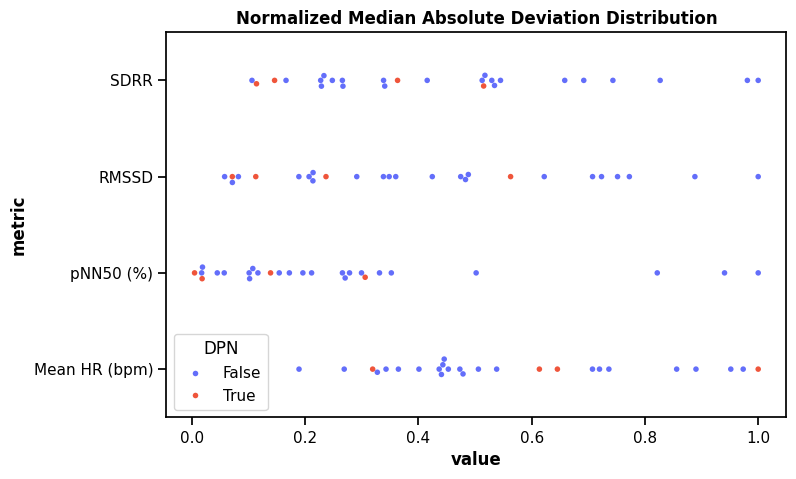

In [11]:
to_plot = [x for x in time_metrics if x != "S"]
figsize = (8, 5)
plot_normalized(normalize_melt(mad_melt[mad_melt["metric"].isin(to_plot )]), "Normalized Median Absolute Deviation Distribution", figsize)
#plot_normalized(normalize_melt(median_melted[median_melted["metric"].isin(to_plot )]), "Normalized Median Distribution", figsize)

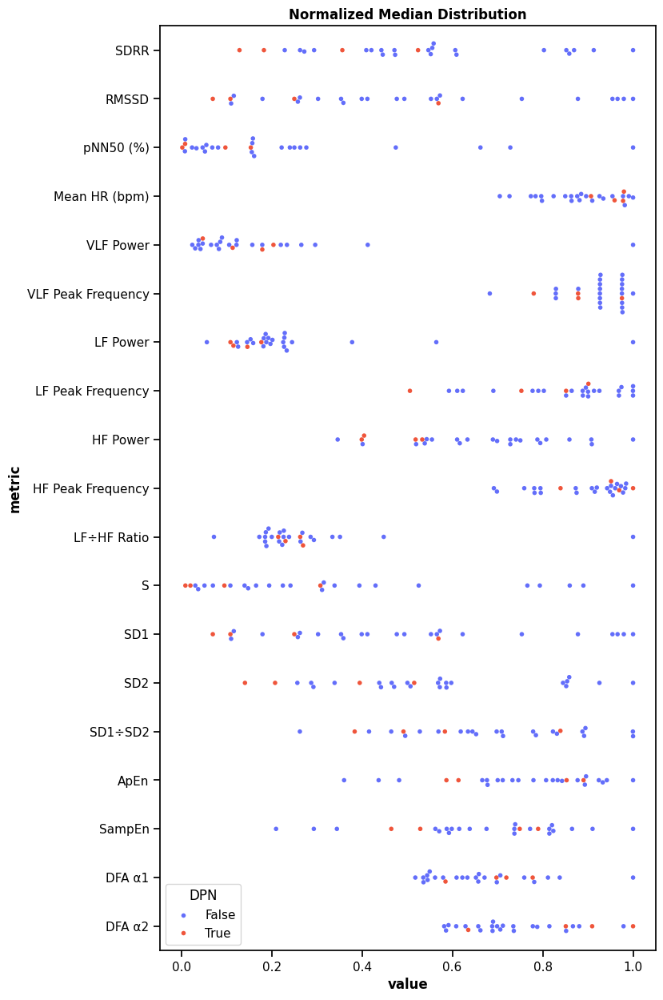

In [12]:
plot_normalized(normalize_melt(median_melted), "Normalized Median Distribution")

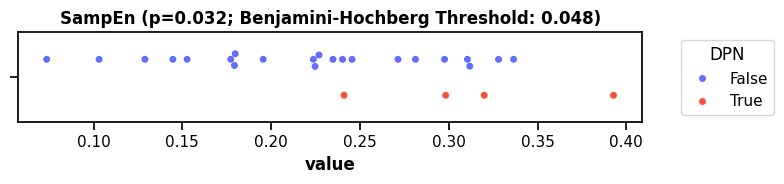

In [13]:
for i, row in result.iterrows():
    if  row["metric"]=="SampEn":
        title = f"{row['metric']} (p={row['p_value']:.3f}; Benjamini-Hochberg Threshold: {row['BH_threshold']:.3f})"
        plt.figure(figsize=(8, 2))
        plt.title(title)
        sns.swarmplot(
            data=mad_melt[mad_melt['metric'] == row['metric']],  
            hue = 'DPN',
            x='value',
            dodge=True
        )
        # Move legend outside the plot
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='DPN')
        plt.tight_layout()

# Permutations test

In [14]:
stats.permutation_test

<function scipy.stats._resampling.permutation_test(data, statistic, *, permutation_type='independent', vectorized=None, n_resamples=9999, batch=None, alternative='two-sided', axis=0, rng=None)>

In [15]:
importlib.reload(CMT)
import numpy as np
from copy import deepcopy

test = CMT.CorrectedMultivariableTest(
    data=median_melted, 
    group_col='metric',
    value_col='value',
    cat_col='DPN',
    cat_val_1=False,
    cat_val_2=True
)

def statistic(x, y, axis):
    return np.mean(x, axis=axis) - np.mean(y, axis=axis)

result = test.permutation_test(statistic, n_permutations=1000)

result.sort_values('p_value', inplace=True)
to_print = deepcopy(result)
to_print.drop(columns=["distribution"], inplace=True)
display(to_print)


,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
SDRR,38.18,0.018,True,20,0.05,True
HF Power,0.000178,0.02,True,19,0.0475,True
SD2,45.85,0.028,True,18,0.045,True
LF Power,2.25e-05,0.0579,False,17,0.0425,False
RMSSD,39.11,0.0599,False,16,0.04,False
S,13459,0.0619,False,15,0.0375,False
Mean HR (bpm),-7.09,0.0639,False,14,0.035,False
SD1,27.65,0.0659,False,13,0.0325,False
DFA α2,-0.14,0.0679,False,12,0.03,False


,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
SDRR,38.18,0.018,True,20,0.05,True


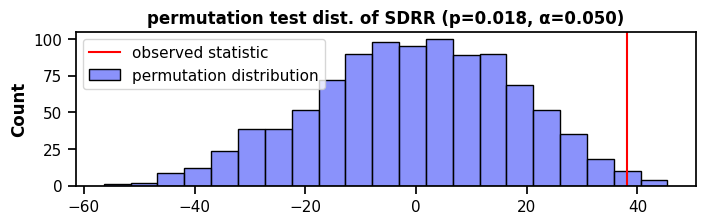

,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
HF Power,0.000178,0.02,True,19,0.0475,True


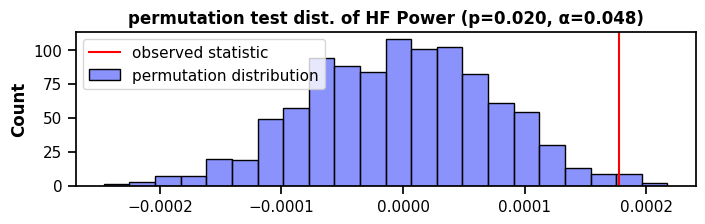

,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
SD2,45.85,0.028,True,18,0.045,True


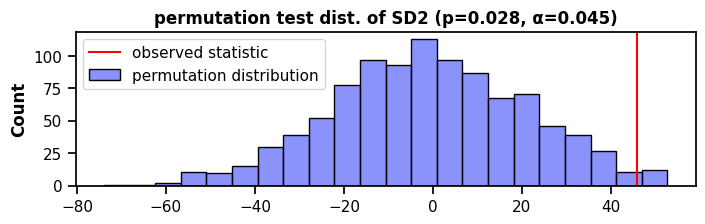

,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
LF Power,2.25e-05,0.0579,False,17,0.0425,False


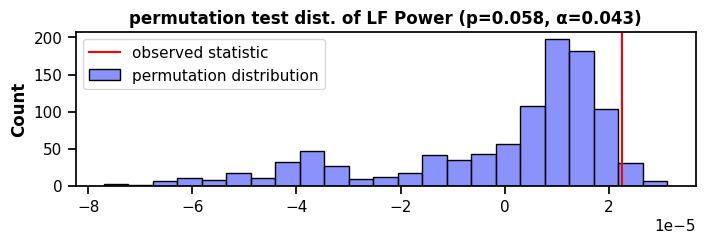

,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
RMSSD,39.11,0.0599,False,16,0.04,False


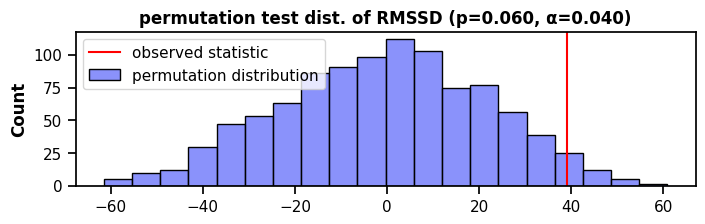

,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
S,13459,0.0619,False,15,0.0375,False


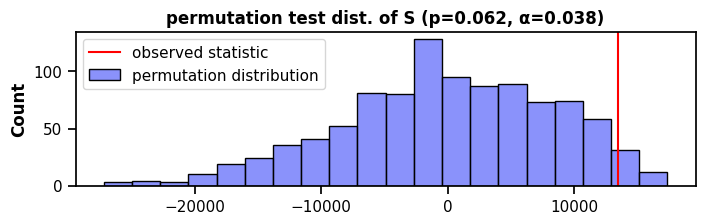

,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
Mean HR (bpm),-7.09,0.0639,False,14,0.035,False


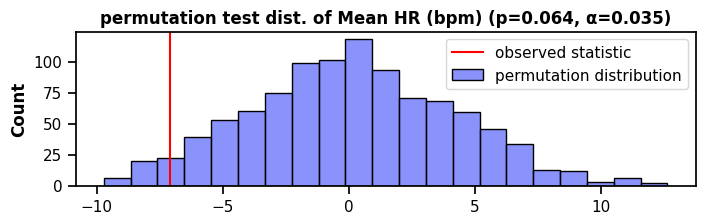

,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
SD1,27.65,0.0659,False,13,0.0325,False


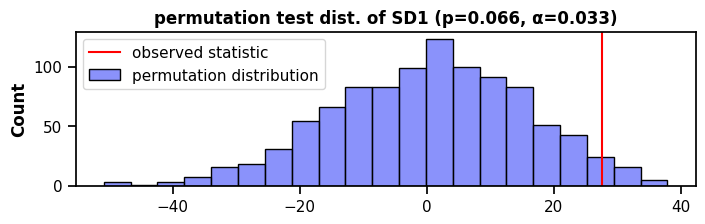

,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
DFA α2,-0.14,0.0679,False,12,0.03,False


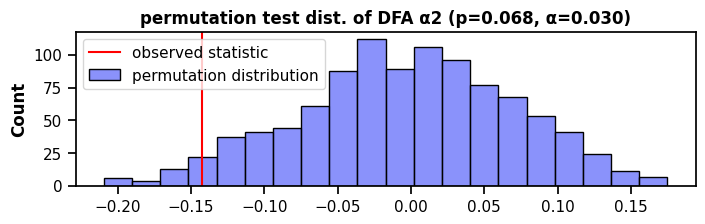

,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
pNN50 (%),8.07,0.13,False,11,0.0275,False


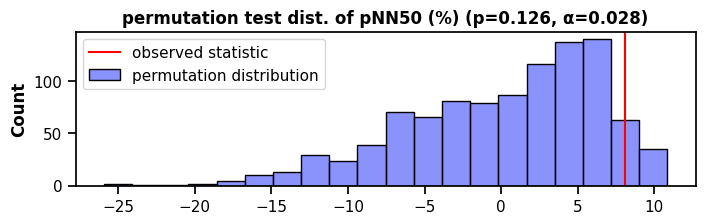

,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
LF Peak Frequency,0.0139,0.19,False,10,0.025,False


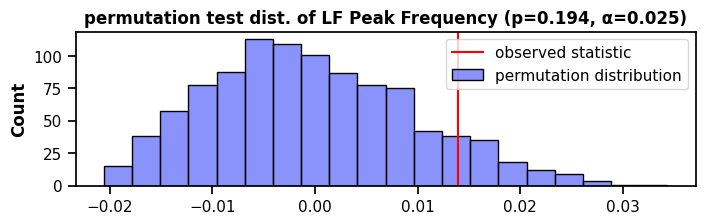

,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
D2,0.67,0.25,False,9,0.0225,False


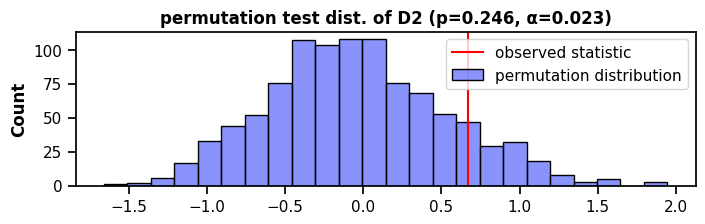

,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
SD1÷SD2,0.0897,0.26,False,8,0.02,False


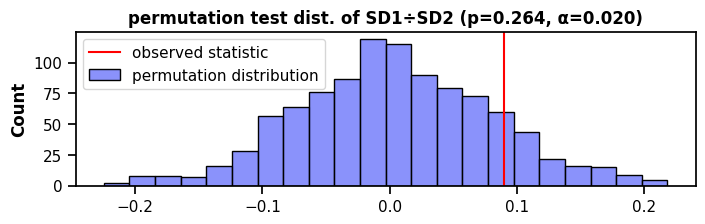

,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
VLF Peak Frequency,0.00148,0.27,False,7,0.0175,False


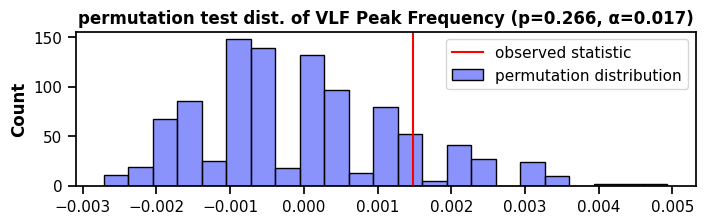

,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
HF Peak Frequency,-0.0211,0.34,False,6,0.015,False


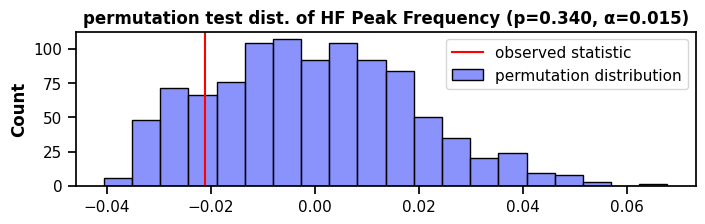

,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
DFA α1,-0.0518,0.56,False,5,0.0125,False


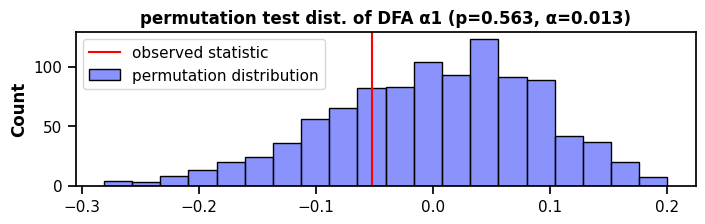

,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
SampEn,0.0494,0.72,False,4,0.01,False


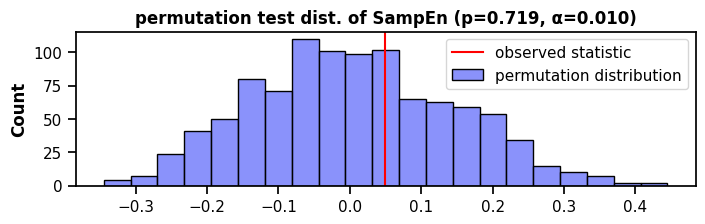

,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
ApEn,0.0312,0.75,False,3,0.0075,False


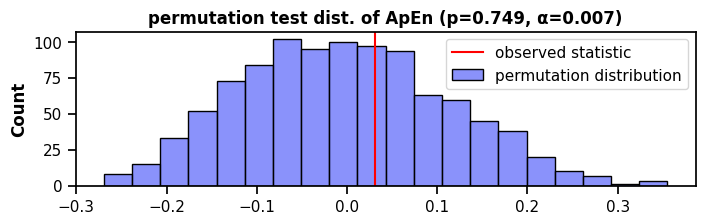

,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
VLF Power,9.53e-07,0.92,False,2,0.005,False


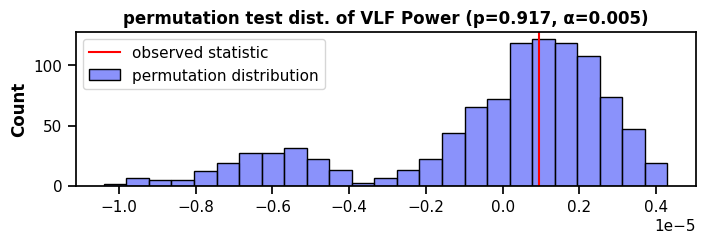

,perm_statistic,p_value,significant,rank,BH_threshold,BH_Significant
metric,,,,,,
LF÷HF Ratio,0.00943,0.92,False,1,0.0025,False


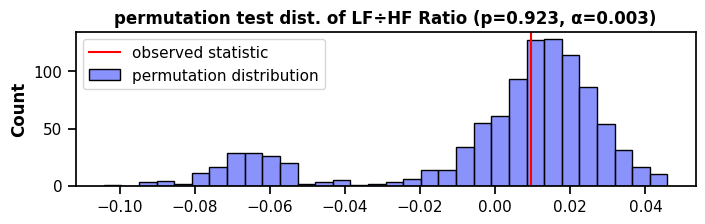

In [16]:
result.tail(3)
for metric in result.index:
    display(to_print[to_print.index == metric])
    plt.figure(figsize=(8, 2))
    sns.histplot(data=result.loc[metric, "distribution"])
    title = f"permutation test dist. of {metric} (p={result.loc[metric, 'p_value']:.3f}, α={result.loc[metric, 'BH_threshold']:.3f})"
    plt.title(title)
    plt.axvline(result.loc[metric, "perm_statistic"], color='red')
    plt.legend(["observed statistic", "permutation distribution"])
    plt.show()

In [17]:
#plot_normalized(normalize_melt(median_melted), "Normalized Median Distribution")

## Odds ratio

In [43]:
median = data.groupby(['id', 'DPN'])[indicator_columns].median()
median = median.reset_index()
median.tail(2)

,id,DPN,SDRR,RMSSD,pNN50 (%),Mean HR (bpm),VLF Power,VLF Peak Frequency,LF Power,LF Peak Frequency,...,LF÷HF Ratio,S,SD1,SD2,SD1÷SD2,ApEn,SampEn,DFA α1,DFA α2,D2
24,5,False,58.39,37.16,1.15,75.09,6.19e-06,0.03,4.71e-05,0.0934,...,0.0911,5688,26.28,75.64,0.39,0.91,0.87,1.09,0.99,-2.99
25,7,False,67.28,56.51,2.67,73.52,3.43e-06,0.0317,4.68e-05,0.12,...,0.0925,10184,39.96,86.81,0.47,0.84,0.82,0.91,0.89,-2.81


In [ ]:
from scipy import stats
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [95]:
def compute_kde_for_metric(data, metric):
    # Separate the data based on the 'DPN' column
    control_data = data[data['DPN'] == False][metric]
    dpn_data = data[data['DPN'] == True][metric]

    # Compute the kernel density estimate for each group
    control_kde = stats.gaussian_kde(control_data)
    dpn_kde = stats.gaussian_kde(dpn_data)

    x_values = np.linspace(min(data[metric]), max(data[metric]), 100)

    kde_df = pd.DataFrame({
        'x_values': x_values,
        'control_kde': control_kde(x_values),
        'dpn_kde': dpn_kde(x_values)
    })

    kde_df["dpn_chance"] = kde_df["dpn_kde"] / (kde_df["dpn_kde"] + kde_df["control_kde"])

    return kde_df

# Example usage
metric = 'SDRR'
kde_df = compute_kde_for_metric(median, metric)
display(kde_df)

,x_values,control_kde,dpn_kde,dpn_chance
0,18.38,0.00252,0.0112,0.82
1,19.63,0.00274,0.0115,0.81
2,20.89,0.00298,0.0117,0.80
3,22.14,0.00322,0.0119,0.79
4,23.40,0.00347,0.0121,0.78
...,...,...,...,...
95,137.58,0.00458,2.68e-05,0.00582
96,138.83,0.00439,2.17e-05,0.00492
97,140.09,0.00419,1.75e-05,0.00415
98,141.34,0.00398,1.4e-05,0.0035


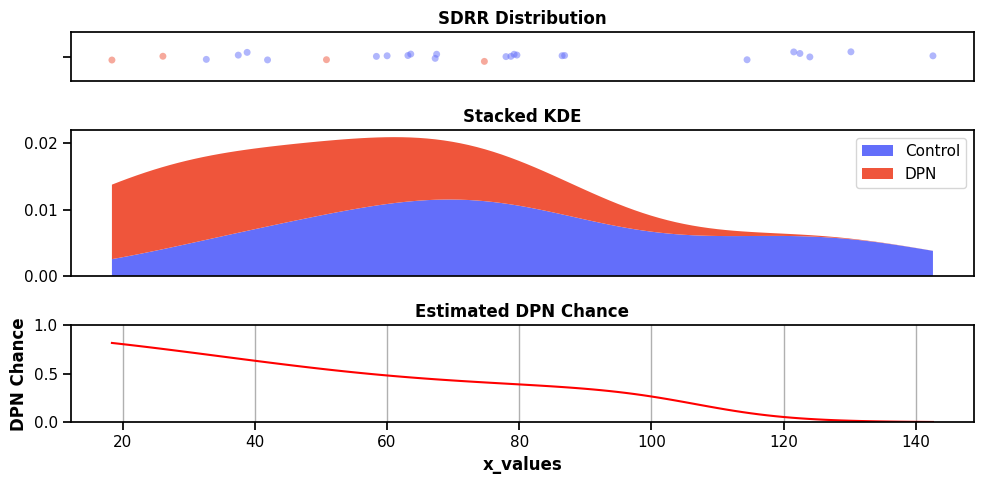

In [ ]:
def plot_metric_distribution(metric, kde_df):
    fig, axs = plt.subplots(3, 1, figsize=(10, 5), gridspec_kw={'height_ratios': [1, 3, 2]})
    
    # Upper subplot
    sns.stripplot(data=median, x=metric, hue='DPN', alpha=0.5, ax=axs[0])
    axs[0].set_title(f'{metric} Distribution, KDE, and DPN Chance')
    axs[0].grid(True, axis='x')
    axs[0].legend().set_visible(False)

    # Middle subplot
    axs[1].stackplot(kde_df['x_values'], kde_df['control_kde'], kde_df['dpn_kde'], labels=['Control', 'DPN'])
    axs[1].legend()
    axs[1].set_title('Stacked KDE')
    axs[1].grid(True, axis='x')

    # Lower subplot
    sns.lineplot(data=kde_df, x='x_values', y='dpn_chance', color='red', ax=axs[2])
    axs[2].set_title('Estimated DPN Chance')
    axs[2].grid(True, axis='x')
    axs[2].set_xlabel('x_values')
    axs[2].set_ylabel('DPN Chance')
    axs[2].set_ylim(0, 1)

    # Remove x labels for the upper and middle plots
    axs[0].set_xlabel('')
    axs[0].set_xticks([])
    axs[1].set_xlabel('')
    axs[1].set_xticks([])

    plt.tight_layout()
    plt.show()

# Example usage
plot_metric_distribution('SDRR', kde_df)


# Deciles approach
Goal: Confirm that the statistical significance gotten from whole dataset median is not just a lucky shot in the dark.

We first assign appropriate decile value for each metric by patient

In [19]:
for column in indicator_columns:  
    data = deciles.make_decile_column(data, column)
data.tail(3)

,t_start,t_end,SDRR,RMSSD,pNN50 (%),Mean HR (bpm),ULF Power,ULF Peak Frequency,ULF Peak Power,VLF Power,...,LF÷HF Ratio_decile,S_decile,SD1_decile,SD2_decile,SD1÷SD2_decile,ApEn_decile,SampEn_decile,DFA α1_decile,DFA α2_decile,D2_decile
3252,21010,21610,38.71,41.98,27.34,75.71,1.28e-09,0.00167,1.49e-06,3.11e-06,...,0,4,5,2,7,8,9,2,2,NaN
3253,34218,34818,88.51,31.71,12.61,79.37,1.33e-08,0.00167,1.59e-05,3.19e-06,...,5,6,4,6,0,3,3,6,7,6
3254,76304,76903,173.75,220.18,22.22,74.74,3.17e-09,0.00167,3.57e-06,1.2e-06,...,0,9,9,9,8,0,0,2,7,9


In [20]:
data.sort_values(by=['DPN', 'id'], inplace=True)
deciles.draw_by_decile(data, "Mean HR (bpm)")

In [21]:
importlib.reload(deciles)


<module 'project_utils.deciles' from 'c:\\GITHUB\\HRV\\HRV-EDA\\project_utils\\deciles.py'>

## Channel identification

most promising channels identified using the permutation test.

In [22]:
channel_test = pd.DataFrame()
channels = pd.DataFrame()

for column in indicator_columns:
    agg_decile = deciles.agg_metric_deciles(data, column)
    agg_decile['metric'] = column
    channels = pd.concat([channels, agg_decile])

    test = CMT.CorrectedMultivariableTest(
        data=agg_decile,
        group_col="decile",
        value_col="value",
        cat_col="DPN",
        cat_val_1=False,
        cat_val_2=True,
    )

    #t_result = test.permutation_test(statistic, n_permutations=1000)
    t_result = test.perform_ManWhitney_U_tests()

    t_result.reset_index(drop=False, inplace=True)
    t_result.insert(0, "metric", column)

    channel_test = pd.concat([channel_test, t_result])
channel_test = channel_test.reset_index(drop=True)
channel_test.tail(3)

,metric,decile,U_statistic,p_value,significant,rank,BH_threshold,BH_Significant
197,D2,7,45,0.97,False,1,0.005,False
198,D2,8,37,0.66,False,5,0.025,False
199,D2,9,49,0.76,False,3,0.015,False


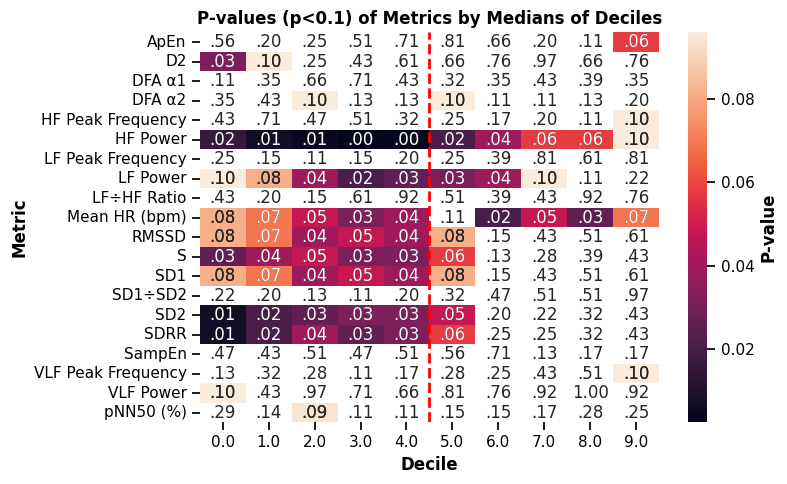

In [23]:
import numpy as np
from matplotlib.colors import ListedColormap

deciles.plot_p_value_heatmap(channel_test, figsize =(8, 5))

In [24]:
man_whitney_channels = {
    "HF Power": list(range(7)),
    "LF Power": list(range(3, 7)),
    "Mean HR (bpm)": list(range(2, 8)),
    "RMSSD": list(range(2, 5)),
    "S": list(range(2, 5)),
    "SD1": list(range(2, 5)),
    "SD2": list(range(5)),
    "SDRR": list(range(5)),
}

man_whitney_channels

{'HF Power': [0, 1, 2, 3, 4, 5, 6],
 'LF Power': [3, 4, 5, 6],
 'Mean HR (bpm)': [2, 3, 4, 5, 6, 7],
 'RMSSD': [2, 3, 4],
 'S': [2, 3, 4],
 'SD1': [2, 3, 4],
 'SD2': [0, 1, 2, 3, 4],
 'SDRR': [0, 1, 2, 3, 4]}

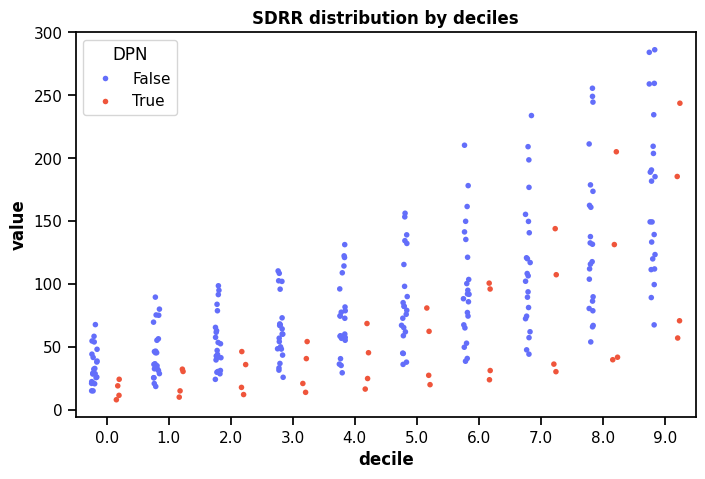

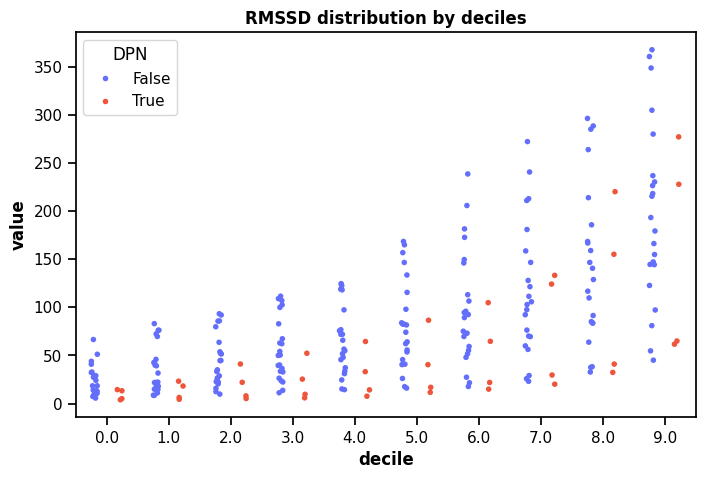

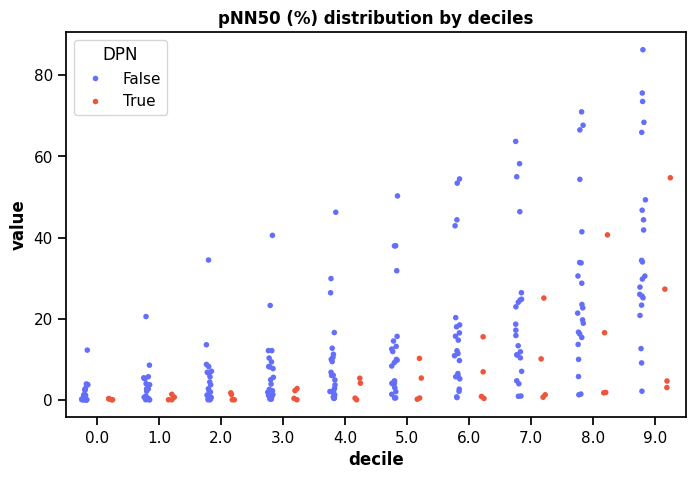

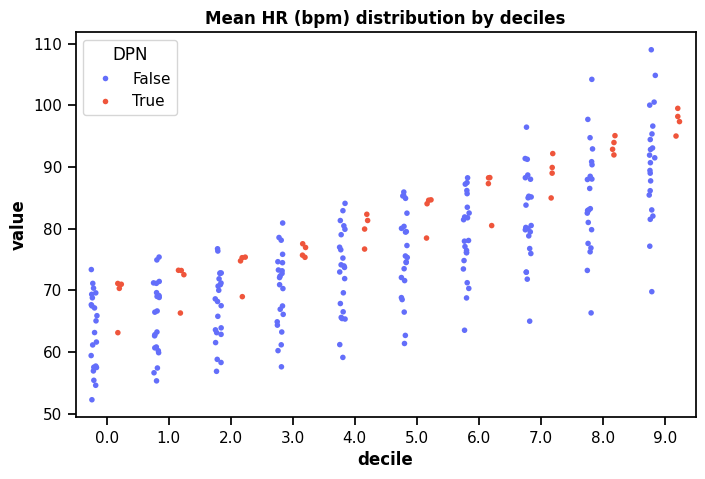

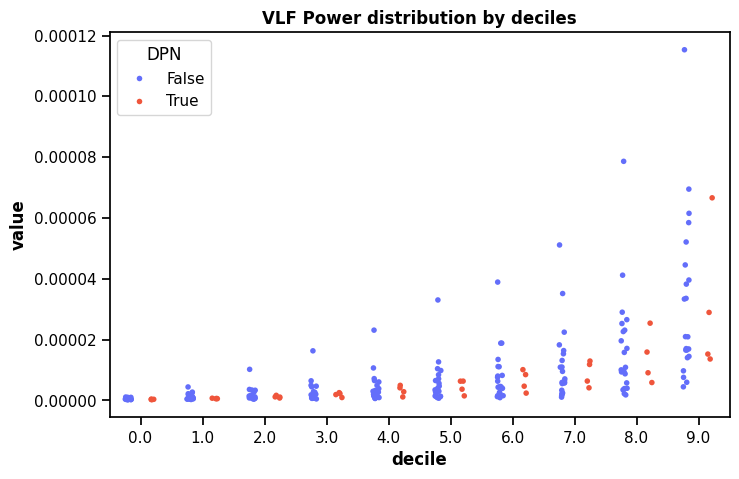

...

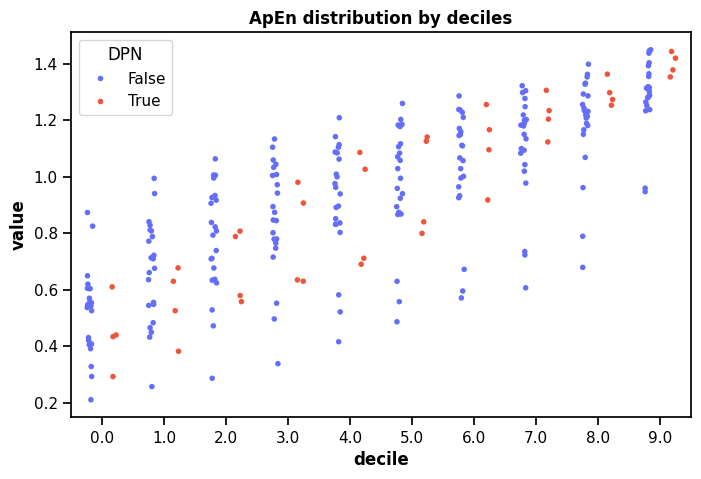

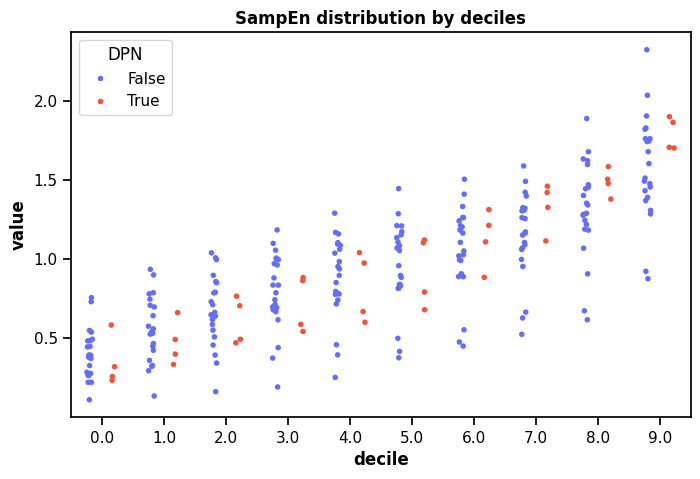

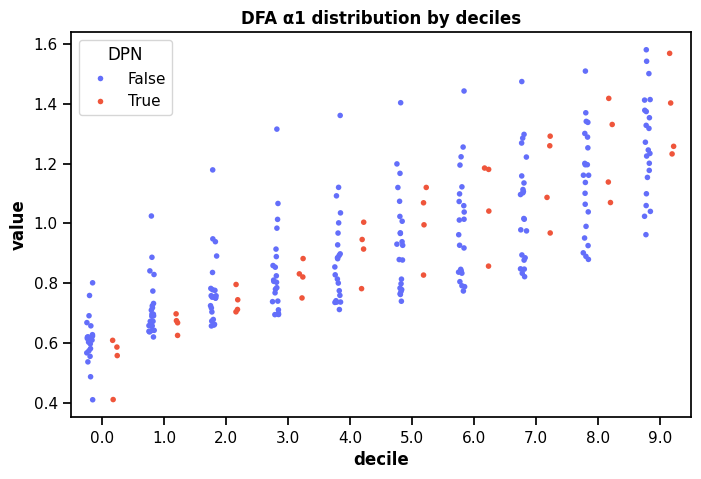

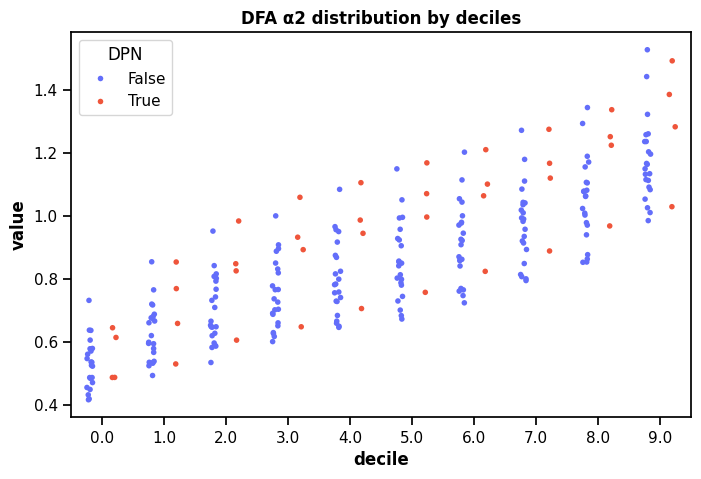

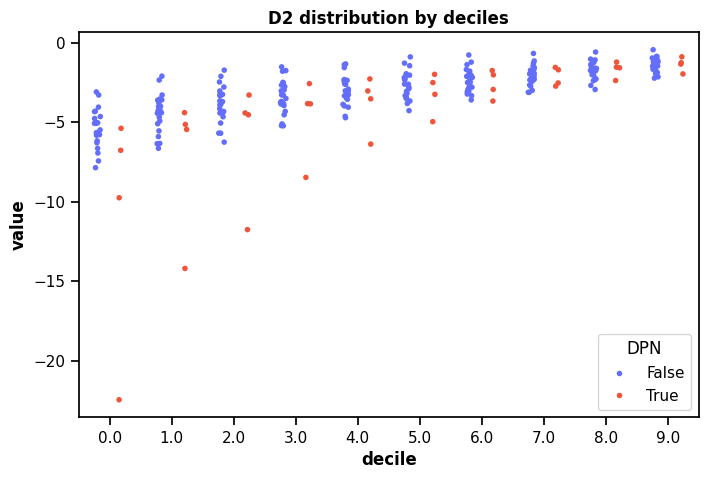

In [25]:
importlib.reload(deciles)
for metric in indicator_columns:
    deciles.plot_decile_dist(channels, metric, None)

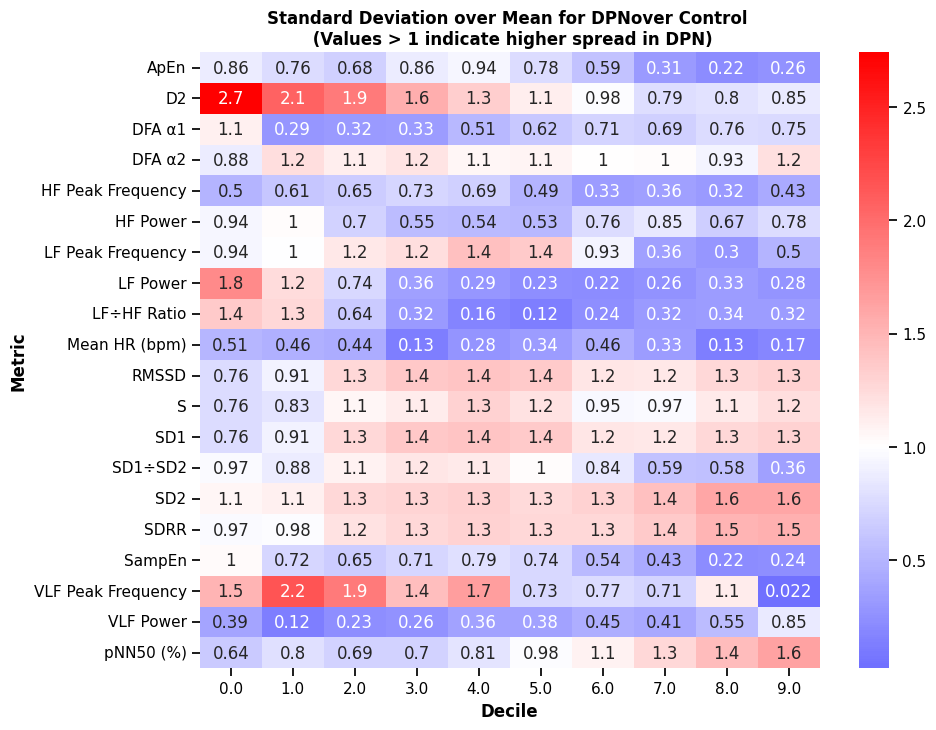

In [26]:
from matplotlib.colors import LinearSegmentedColormap

def std_over_mean(x):
    return np.std(x) / np.mean(x)

def mad_over_median(x):
    mad = np.median(np.abs(x - np.median(x)))
    return mad / np.median(x)

def calculate_spread_ratio(channels, spread_func):
    channels['spread'] = channels.groupby(['metric', 'decile', 'DPN'])['value'].transform(spread_func)
    decile_spread_ratio = channels.pivot_table(index='metric', columns=['decile', 'DPN'], values='spread')
    decile_spread_ratio = decile_spread_ratio.xs(True, level='DPN', axis=1) / decile_spread_ratio.xs(False, level='DPN', axis=1)
    return decile_spread_ratio

def plot_spread_ratio_heatmap(spread_ratio, title):
    # Create a custom colormap
    colors = [(0, 'blue'), (0.5, 'white'), (1, 'red')]
    cmap = LinearSegmentedColormap.from_list('custom_cmap', colors, N=256)
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(spread_ratio, annot=True, cmap=cmap, center=1)
    plt.title(title)
    plt.xlabel('Decile')
    plt.ylabel('Metric')
    plt.show()



std_over_mean_ratio = calculate_spread_ratio(channels, std_over_mean)
plot_spread_ratio_heatmap(std_over_mean_ratio, "Standard Deviation over Mean for DPNover Control \n (Values > 1 indicate higher spread in DPN)")
# Calculate and display median_over_mad spread ratio


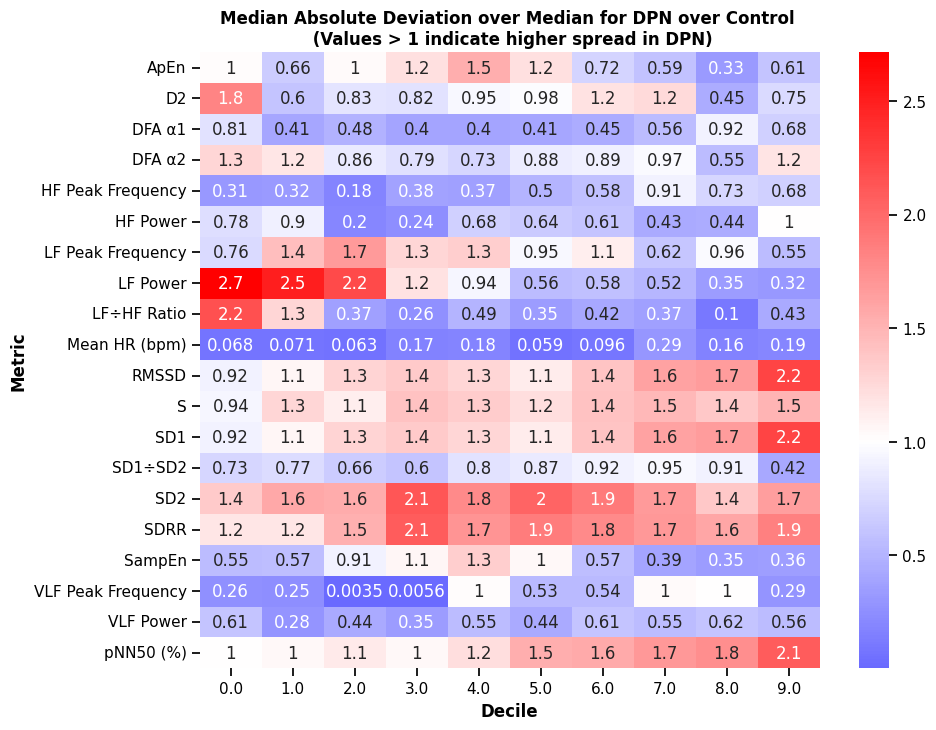

In [27]:
median_over_mad_ratio = calculate_spread_ratio(channels, mad_over_median)

plot_spread_ratio_heatmap(median_over_mad_ratio, "Median Absolute Deviation over Median for DPN over Control \n (Values > 1 indicate higher spread in DPN)")



In [28]:
channel_test = channel_test[channel_test.p_value < 0.1].iloc[:,].reset_index(drop=True)

print(
    "Total promissing channels: ",
    channel_test.shape[0],
    "from ",
    len(indicator_columns) * 10,
)
display(channel_test)

Total promissing channels:  66 from  200


,metric,decile,U_statistic,p_value,significant,rank,BH_threshold,BH_Significant
0,SDRR,0,80,0.00709,True,10,0.05,True
1,SDRR,1,76,0.0207,True,9,0.045,True
2,SDRR,2,73,0.0395,True,6,0.03,False
3,SDRR,3,75,0.026,True,8,0.04,True
4,SDRR,4,74,0.0322,True,7,0.035,True
...,...,...,...,...,...,...,...,...
61,ApEn,9,17,0.0577,False,10,0.05,False
62,DFA α2,2,20,0.0959,False,9,0.045,False
63,DFA α2,5,20,0.0959,False,10,0.05,False
64,D2,0,74,0.0322,True,10,0.05,True


# Heart rate as invariant metric.
Since HR is determined by individuals activity and bodily state and HRV is determined on five minute intervals it should be a good metric to compare others against.

First we discard any unrealistic HR values

In [29]:
data = data[data["Mean HR (bpm)"]>45]

In [30]:
title = f"HR (bpm) in Diabetic peripheral neuropathy patients"
plotter = OverallDetailComparisonPlot(
    data=data, 
    x_column="id",
    y_column="Mean HR (bpm)",
    hue_column="DPN",
    detail_mode="box",
    points='all',
    title=title)
plotter.show()

There is a lot of variance in heartbeat between each individual.

In [31]:
display(data)

,t_start,t_end,SDRR,RMSSD,pNN50 (%),Mean HR (bpm),ULF Power,ULF Peak Frequency,ULF Peak Power,VLF Power,...,LF÷HF Ratio_decile,S_decile,SD1_decile,SD2_decile,SD1÷SD2_decile,ApEn_decile,SampEn_decile,DFA α1_decile,DFA α2_decile,D2_decile
0,0.76,600.40,59.95,50.34,4.16,81.75,2.81e-09,0,1.97e-06,2.23e-06,...,9,1,2,2,3,7,7,8,4,NaN
1707,33024,33623,111.81,97.21,20.65,61.55,3.43e-09,0.00167,3.5e-06,4.1e-06,...,2,7,6,8,3,3,4,6,9,7
1708,32423,33023,73.34,107.40,28.18,58.89,4.93e-08,0,4.35e-05,5.37e-07,...,0,4,8,1,9,6,7,0,1,2
1709,31823,32422,123.29,129.77,22.53,60.90,1.5e-08,0.00167,1.78e-05,4.43e-06,...,1,9,9,8,6,1,2,1,7,8
1710,31222,31822,50.69,54.19,20.21,57.46,1.78e-10,0.00167,1.79e-07,5.58e-06,...,1,1,2,0,7,9,9,4,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3249,22812,23412,44.77,26.04,4.24,80.28,3.24e-08,0.00167,3.17e-05,3.82e-06,...,4,3,3,4,2,5,5,5,6,1
3250,22212,22812,30.89,24.63,3.13,79.80,2.35e-08,0,1.61e-05,4.24e-06,...,4,2,3,1,5,9,9,6,5,NaN
3251,21611,22211,40.47,34.10,13.03,77.50,1.07e-08,0,9.96e-06,2.39e-06,...,2,4,4,3,5,9,8,4,7,1
3252,21010,21610,38.71,41.98,27.34,75.71,1.28e-09,0.00167,1.49e-06,3.11e-06,...,0,4,5,2,7,8,9,2,2,NaN


In [32]:
import general_utils.utils as u


data["Mean HR (bpm)"] = data["Mean HR (bpm)"].astype(float)
decile = data
decile['Decile'] = decile.groupby('id')["Mean HR (bpm)"].transform(lambda x: pd.qcut(x, 10, labels=False))

decile.head()

,t_start,t_end,SDRR,RMSSD,pNN50 (%),Mean HR (bpm),ULF Power,ULF Peak Frequency,ULF Peak Power,VLF Power,...,S_decile,SD1_decile,SD2_decile,SD1÷SD2_decile,ApEn_decile,SampEn_decile,DFA α1_decile,DFA α2_decile,D2_decile,Decile
0,0.76,600.40,59.95,50.34,4.16,81.75,2.81e-09,0,1.97e-06,2.23e-06,...,1,2,2,3,7,7,8,4,NaN,8
1707,33024,33623,111.81,97.21,20.65,61.55,3.43e-09,0.00167,3.5e-06,4.1e-06,...,7,6,8,3,3,4,6,9,7,3
1708,32423,33023,73.34,107.40,28.18,58.89,4.93e-08,0,4.35e-05,5.37e-07,...,4,8,1,9,6,7,0,1,2,2
1709,31823,32422,123.29,129.77,22.53,60.90,1.5e-08,0.00167,1.78e-05,4.43e-06,...,9,9,8,6,1,2,1,7,8,3
1710,31222,31822,50.69,54.19,20.21,57.46,1.78e-10,0.00167,1.79e-07,5.58e-06,...,1,2,0,7,9,9,4,0,0,2


Check whether the decile is correctly calculated

In [33]:
title = "Deciles of Mean HR (bpm) in PDR patients"
plotter = OverallDetailComparisonPlot(data=decile, 
                    x_column="id",
                    y_column="Mean HR (bpm)",
                    hue_column="Decile",
                    title=title,
                    category_orders={"Decile": [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]},
                    detail_mode="strip")

plotter.setup_general_layout(ratio=1/5)
                    
plotter.show()

In [34]:
df_decile = decile[~decile.Decile.isin([0, 9])]
df_decile = df_decile[df_decile['SDRR'] <= 1000]
df_decile = df_decile[df_decile['RMSSD'] <= 1000]

Bellow are the results we got without discarding the 0th and 9th decile in Heart rate (BPM)

Now we compar the spread ratios

# Appendix

## Image generator

In [35]:
import plotly.express as px

def bolden(text):
    return f"<b>{text}</b>"

title = bolden("Median SDRR per Patient (p=0.032; α=0.043)")
fig = px.strip(median_melted[median_melted.metric=='SDRR'], x="DPN", y="value", color="DPN", title=title)
fig.update_traces(marker=dict(size=11, line=dict(width=2, color='black')))
fig.update_traces(jitter=0.8)

fig.for_each_trace(lambda t: t.update(name='Control' if t.name == 'False' else 'DPN'))

axis_font = {'size': 16, 'family': 'Arial', 'color': 'black'}
fig.update_layout(
    title={'text': title, 'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'color': 'black'}},
    xaxis_title={'text': bolden('Condition'), 'font': axis_font},
    yaxis_title={'text': bolden('SDRR (ms)'), 'font': axis_font},
    font=dict(family="Arial", size=16, color="black"),
    width=500, height = 400,
    margin=dict(l=20, r=20, t=70, b=20),
    legend=dict(title='Condition', x=0.99, y=0.99, xanchor='right', yanchor='top'),
    xaxis=dict(
        tickmode='array',
        tickvals=[False, True],
        ticktext=['Control (Diabetes)', 'Diabetic Peripheral Neuropathy']
    )
)

fig.update_layout(showlegend=False)
fig.write_image("high_quality_plot.png", format='png', scale=6)


fig.show()

In [36]:
title = bolden("SDRR Distribution per Patient for Control and DPN")
data['id'] = data.id.astype(str)

fig = px.box(data, x='id', y="SDRR", color="DPN", title=title)
#fig.update_traces(marker=dict(size=11, line=dict(width=1, color='black')))
fig.update_traces(jitter=0.8)

fig.for_each_trace(lambda t: t.update(name='Control' if t.name == 'False' else 'DPN'))

axis_font = {'size': 16, 'family': 'Arial', 'color': 'black'}
fig.update_layout(
    title={'text': title, 'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'color': 'black'}},
    xaxis_title={'text': bolden('Patient id'), 'font': axis_font},
    yaxis_title={'text': bolden('SDRR (ms)'), 'font': axis_font},
    font=dict(family="Arial", size=16, color="black"),

    width=600, height = 600,

    margin=dict(l=20, r=20, t=40, b=20),
    legend=dict(title='Condition', x=0.99, y=0.99, xanchor='right', yanchor='top'),

)


#fig.update_layout(showlegend=False)
fig.write_image("messy_plot.png", format='png', scale=6)


fig.show()